In [1]:
import visual_behavior_glm.src.GLM_params as glm_params
import visual_behavior_glm.src.GLM_analysis_tools as gat
from visual_behavior_glm.src.glm import GLM
import matplotlib.pyplot as plt
import visual_behavior.data_access.loading as loading
import visual_behavior.database as db
import plotly.express as px

import pandas as pd
import numpy as np
import os

from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns

In [2]:
%matplotlib inline


## get results for glm version 4

In [3]:
results_all = gat.retrieve_results(results_type='full')

In [4]:
results_all['glm_version'].unique()
#use v4

array(['3', '4_L2_optimize_by_session', '4_L2_fixed_lambda=1',
       '4_L2_optimize_by_cell', '2', '4_L2_opt_by_cell_tighter_grid',
       '4_L2_opt_by_session_tighter_grid', '5_L2_fixed_lambda=1',
       '5_L2_optimize_by_cell', '5_L2_optimize_by_session'], dtype=object)

In [5]:
rs = gat.retrieve_results(search_dict = {'glm_version': '4_L2_optimize_by_cell'}, results_type='summary')
len(rs)

1365760

### make a new column called 'identifier' that is {OPHYS_EXPERIMENT_ID}_{CELL_SPECIMEN_ID}. This will give each a unique ID

In [6]:
rs['identifier'] = rs['ophys_experiment_id'].astype(str) + '_' +  rs['cell_specimen_id'].astype(str)

In [7]:
rs

,_id,index,dropout,variance_explained,fraction_change_from_full,absolute_change_from_full,cell_specimen_id,ophys_experiment_id,ophys_session_id,behavior_session_id,...,super_container_id,cre_line,session_tags,failure_tags,exposure_number,model_outputs_available,location,glm_version,entry_time_utc,identifier
0,5f22221a7eeb3a3cbb69c983,0,Full,0.229436,0.000000,0.000000,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.596382,991852008_1017215561
1,5f22221a7eeb3a3cbb69c984,1,intercept,0.229937,0.002183,0.000501,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.598786,991852008_1017215561
2,5f22221a7eeb3a3cbb69c985,2,time,0.229769,0.001453,0.000333,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.600893,991852008_1017215561
3,5f22221a7eeb3a3cbb69c986,3,pre_licks,0.229634,0.000864,0.000198,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.603036,991852008_1017215561
4,5f22221a7eeb3a3cbb69c987,4,post_licks,0.227139,-0.010010,-0.002297,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.605159,991852008_1017215561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365755,5f24621b2ac3d684bf7369e9,27,model_omissions1,0.048034,0.048249,0.002211,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.153505,808621034_962642740
1365756,5f24621b2ac3d684bf7369ea,28,model_timing1D,0.048441,0.057133,0.002618,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.156075,808621034_962642740
1365757,5f24621b2ac3d684bf7369eb,29,all-images,0.039222,-0.144061,-0.006601,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.158640,808621034_962642740
1365758,5f24621b2ac3d684bf7369ec,30,visual,0.034920,-0.237943,-0.010903,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.161200,808621034_962642740


### pivot the table to get it into a form for clustering

#### get fraction change in explained variance after dropout of each regressor

In [8]:
model_output_type = 'fraction_change_from_full'
rsp = rs.pivot(index='identifier',columns='dropout',values=model_output_type).reset_index()
rsp

dropout,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,omissions,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,...,0.008544,0.007587,-0.005937,0.011424,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425
1,1000743008_1003146177,-0.0,0.085372,-0.009939,-0.004046,-0.123170,-0.096961,-0.024053,-0.008854,-0.028034,...,-0.243510,-0.071303,-0.059572,-0.210135,-0.300627,-0.115810,-0.231755,-0.051469,-0.000785,-0.039939
2,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,...,0.020436,0.001011,0.003103,0.031004,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412
3,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,...,-0.000316,-0.004966,0.002149,0.003036,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959
4,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,...,0.002760,-0.001018,0.000574,0.004443,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42675,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,...,0.106612,0.027403,0.043114,0.107631,0.157746,-0.034934,0.070162,0.002936,-0.020402,-0.542672
42676,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,...,0.004121,0.005182,-0.001993,0.002772,0.005179,-0.003617,0.017730,0.001021,-0.057415,-1.165996
42677,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,...,0.094648,0.015220,0.040880,0.117245,0.166319,0.013375,0.064248,0.013400,-0.003067,-0.598106
42678,995439942_994310024,0.0,-0.277435,0.013547,0.000625,0.005525,0.004325,0.005053,0.000903,0.003351,...,-0.010042,-0.002331,0.003029,0.002511,0.019762,-0.083882,0.011392,-0.028149,0.004683,-0.380402


#### get variance explained for full model

In [9]:
tmp = 'variance_explained'
ve = rs.pivot(index='identifier',columns='dropout',values=tmp).reset_index()
ve

dropout,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,omissions,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual
0,1000743008_1003146172,0.063156,0.054300,0.063040,0.063193,0.064096,0.063674,0.063490,0.063116,0.063353,...,0.063696,0.063636,0.062781,0.063878,0.064101,0.058477,0.063833,0.061831,0.063093,0.048730
1,1000743008_1003146177,-0.007289,-0.007912,-0.007217,-0.007260,-0.006392,-0.006583,-0.007114,-0.007225,-0.007085,...,-0.005514,-0.006770,-0.006855,-0.005758,-0.005098,-0.006445,-0.005600,-0.006914,-0.007284,-0.006998
2,1000743008_1003146180,0.045686,0.038604,0.045898,0.045710,0.046629,0.046225,0.045850,0.045821,0.045868,...,0.046620,0.045732,0.045828,0.047102,0.047387,0.045938,0.047163,0.045566,0.045706,0.034154
3,1000743008_1003146183,0.200945,0.158703,0.213504,0.200990,0.201434,0.201321,0.201314,0.201323,0.201499,...,0.200881,0.199947,0.201377,0.201555,0.202583,0.189449,0.200796,0.203766,0.201807,0.136651
4,1000743008_1003146186,0.152564,0.096339,0.155878,0.152599,0.152916,0.153612,0.153020,0.152379,0.152082,...,0.152985,0.152408,0.152651,0.153242,0.153190,0.153469,0.154260,0.152849,0.152944,0.086069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42675,995439942_994310000,0.019296,0.009937,0.019431,0.019376,0.020588,0.019795,0.019770,0.019573,0.019571,...,0.021353,0.019824,0.020127,0.021372,0.022339,0.018621,0.020649,0.019352,0.018902,0.008824
42676,995439942_994310003,0.275206,-0.032619,0.286904,0.275419,0.276249,0.275579,0.276400,0.275368,0.275027,...,0.276340,0.276632,0.274657,0.275969,0.276631,0.274210,0.280085,0.275487,0.259405,-0.045683
42677,995439942_994310018,0.017399,0.007973,0.017511,0.017467,0.018096,0.018042,0.018081,0.017747,0.017251,...,0.019046,0.017664,0.018110,0.019439,0.020293,0.017632,0.018517,0.017632,0.017346,0.006993
42678,995439942_994310024,0.105133,0.075965,0.106557,0.105198,0.105713,0.105587,0.105664,0.105228,0.105485,...,0.104077,0.104888,0.105451,0.105397,0.107210,0.096314,0.106330,0.102173,0.105625,0.065140


In [11]:
tmp = ve.rename(columns={'Full':'varience_explained_full_model'})
rsp = rsp.merge(tmp[['identifier','varience_explained_full_model']], on=['identifier'])

#### filter out poorly fit cells

In [10]:
cells_to_include = ve[ve['Full']>0.01].identifier.values

order = np.argsort(ve[ve.identifier.isin(cells_to_include)==True]['Full'])
cell_order = cells_to_include[order]

len(cells_to_include)

26795

In [12]:
rsp = rsp[rsp.identifier.isin(cells_to_include)==True]
len(rsp)

26795

### merge in the identifier, cre_line, session_type and equipment_name columns

In [13]:
rspm = rsp.merge(rs[['identifier','cre_line','session_type','equipment_name']].drop_duplicates(),left_on='identifier',right_on='identifier',how='inner')
rspm

,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,pre_licks,pupil,rewards,running,time,visual,varience_explained_full_model,cre_line,session_type,equipment_name
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,...,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425,0.063156,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
1,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,...,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412,0.045686,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
2,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,...,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959,0.200945,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
3,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,...,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852,0.152564,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
4,1000743008_1003146190,0.0,-0.089674,0.000823,0.000713,0.027508,0.019429,0.006967,0.006088,0.004045,...,0.030949,-0.019613,0.021468,0.005709,0.000490,-0.184349,0.045860,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26790,995439942_994309997,0.0,-0.673633,0.086221,0.006062,0.071843,0.050225,0.058348,-0.005161,0.010604,...,0.170683,-0.033002,0.096974,0.003498,0.028642,-0.599882,0.014318,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4
26791,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,...,0.157746,-0.034934,0.070162,0.002936,-0.020402,-0.542672,0.019296,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4
26792,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,...,0.005179,-0.003617,0.017730,0.001021,-0.057415,-1.165996,0.275206,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4
26793,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,...,0.166319,0.013375,0.064248,0.013400,-0.003067,-0.598106,0.017399,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4


### add a column for session ID (1, 3, 4, or 6)

In [14]:
def map_session_types(session_type):
    session_id = session_type[6:7]
    return session_id
rspm['session_id'] = rspm['session_type'].map(lambda st:map_session_types(st))
rspm['session_id'].unique()

array(['1', '3', '4', '6'], dtype=object)

### save feature matrix to disk

In [15]:
# save = True
# if save:
#     rspm.to_csv('/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/ophys_glm/fraction_change_var_explained_v_4_L2_fixed_lambda=1_filtered_2020.08.11.csv', index=False)

### get the column names to use for clustering

In [16]:
cols_for_clustering = [col for col in rspm.columns if col not in ['identifier','cre_line','session_type','equipment_name', 'session_id']]
cols_for_clustering = [col for col in cols_for_clustering if col not in ['image0','image1','image2','image3','image4','image5','image6','image7',
                                                                  'visual']]

cols_for_clustering

['Full',
 'all-images',
 'beh_model',
 'change',
 'correct_rejects',
 'false_alarms',
 'hits',
 'image_expectation',
 'intercept',
 'misses',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 'omissions',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'pupil',
 'rewards',
 'running',
 'time',
 'varience_explained_full_model']

In [17]:
cols_for_clustering = [
 'omissions',
 'all-images',
 'image_expectation',
 'change',
 'hits',
 'misses',
 'correct_rejects',
 'false_alarms',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'rewards',
 'pupil',
 'running',
 'time',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 ]

### plot feature matrix

Text(0.5, 1, 'GLM feature matrix')

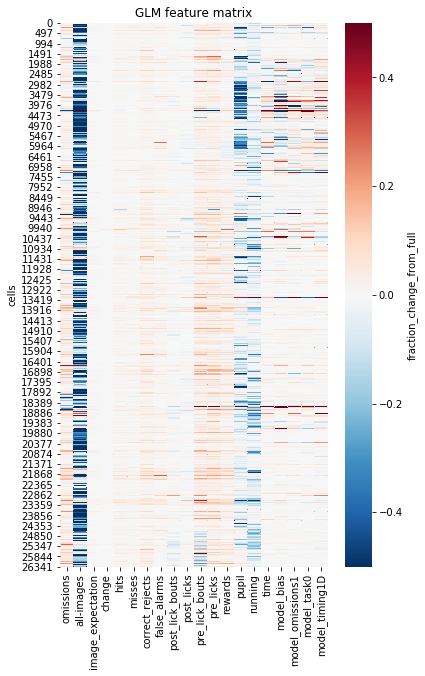

In [18]:
feature_matrix = rspm[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

Text(0.5, 1, 'GLM feature matrix')

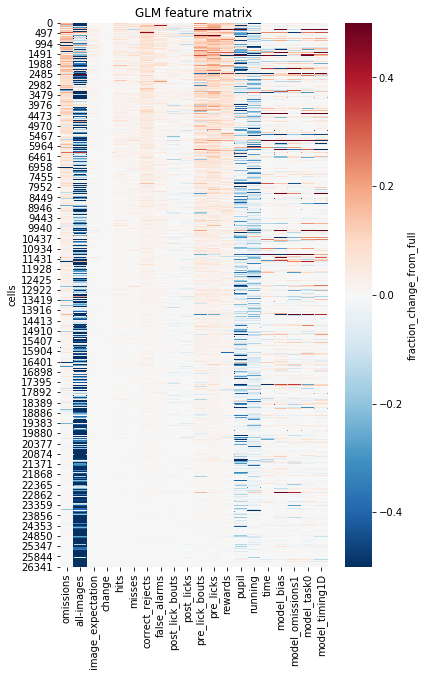

In [19]:
# sorted by overall variance explaned
feature_matrix = rspm.sort_values('varience_explained_full_model').reset_index()[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

Text(0.5, 1, 'GLM feature matrix')

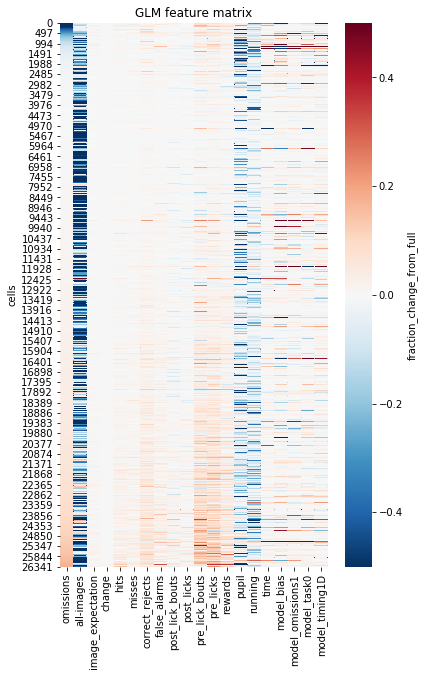

In [20]:
# sorted by omission dropout
feature_matrix = rspm.sort_values('omissions').reset_index()[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

### do k-means on the full feature matrix

In [21]:
# create kmeans object
kmeans = KMeans(n_clusters=4)

In [22]:
# fit kmeans object to data
kmeans.fit(rspm[cols_for_clustering])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [23]:
rspm['k-means_cluster_id'] = kmeans.fit_predict(rspm[cols_for_clustering])

#### how many clusters do we get? 

In [24]:
rspm['k-means_cluster_id'].value_counts()

1    13108
2     8248
0     5351
3       88
Name: k-means_cluster_id, dtype: int64

### make a tsne plot

In [25]:
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)

In [26]:
tsne_results = tsne.fit_transform(rspm[cols_for_clustering])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 26795 samples in 0.047s...
[t-SNE] Computed neighbors for 26795 samples in 14.195s...
[t-SNE] Computed conditional probabilities for sample 1000 / 26795
[t-SNE] Computed conditional probabilities for sample 2000 / 26795
[t-SNE] Computed conditional probabilities for sample 3000 / 26795
[t-SNE] Computed conditional probabilities for sample 4000 / 26795
[t-SNE] Computed conditional probabilities for sample 5000 / 26795
[t-SNE] Computed conditional probabilities for sample 6000 / 26795
[t-SNE] Computed conditional probabilities for sample 7000 / 26795
[t-SNE] Computed conditional probabilities for sample 8000 / 26795
[t-SNE] Computed conditional probabilities for sample 9000 / 26795
[t-SNE] Computed conditional probabilities for sample 10000 / 26795
[t-SNE] Computed conditional probabilities for sample 11000 / 26795
[t-SNE] Computed conditional probabilities for sample 12000 / 26795
[t-SNE] Computed conditional probabilities for s

#### assign tsne reults to new columns

In [27]:
rspm['tsne-2d-one'] = tsne_results[:,0]
rspm['tsne-2d-two'] = tsne_results[:,1]

In [28]:
rspm['session_type'].unique()

array(['OPHYS_1_images_B', 'OPHYS_3_images_B', 'OPHYS_4_images_A',
       'OPHYS_6_images_A', 'OPHYS_1_images_A', 'OPHYS_3_images_A',
       'OPHYS_4_images_B', 'OPHYS_6_images_B'], dtype=object)

### make a histogram of the omission dropout values

Text(0.5, 0, 'omissions dropout fractional change in var explained')

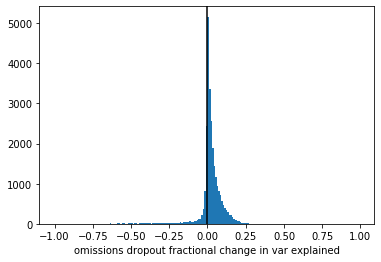

In [29]:
fig,ax=plt.subplots()
ax.hist(rspm['omissions'],bins=np.arange(-1,1,0.01))
ax.axvline(0,color='black')
ax.set_xlabel('omissions dropout fractional change in var explained')

### make a new column that identifies cells as 'modulated' by running or omissions (the threshold is up for debate!)

In [30]:
def is_modulated(v, threshold=0):
    return v < threshold
rspm['omission_modulated'] = rspm['omissions'].map(lambda v:is_modulated(v, threshold=0))
rspm['running_modulated'] = rspm['running'].map(lambda v:is_modulated(v, threshold=0))

### plot the tsne results, coloring dots in different ways
It looks like they cluster almost perfectly by omission modulation!

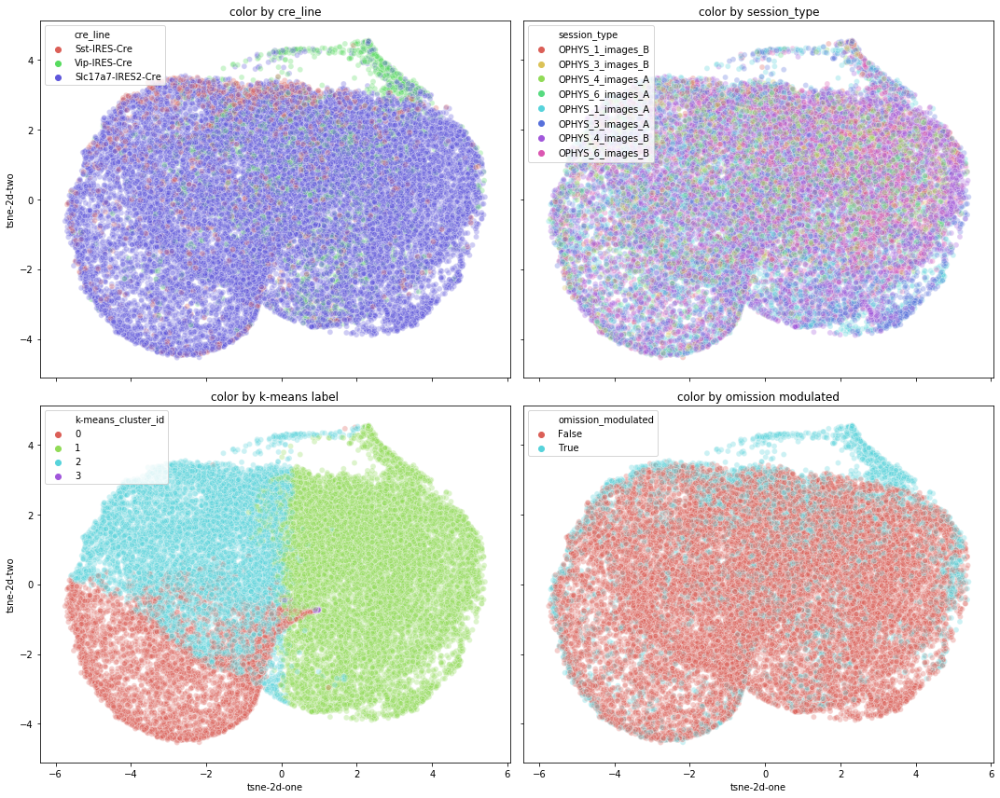

In [31]:

fig,ax=plt.subplots(2,2,figsize=(15,12),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="cre_line",
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[0,0]
)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_type",
    palette=sns.color_palette("hls", 8),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[0,1]
)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="k-means_cluster_id",
    palette=sns.color_palette("hls", 4),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[1,0]
)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue='omission_modulated',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[1,1]
)
fig.tight_layout()
for ii,hue in enumerate(['cre_line','session_type','k-means label', 'omission modulated']):
    ax.flatten()[ii].set_title('color by {}'.format(hue))
fig.tight_layout()

### plot tsne again, grouped by cre-line

Text(0.5, 1.0, 'Sst only')

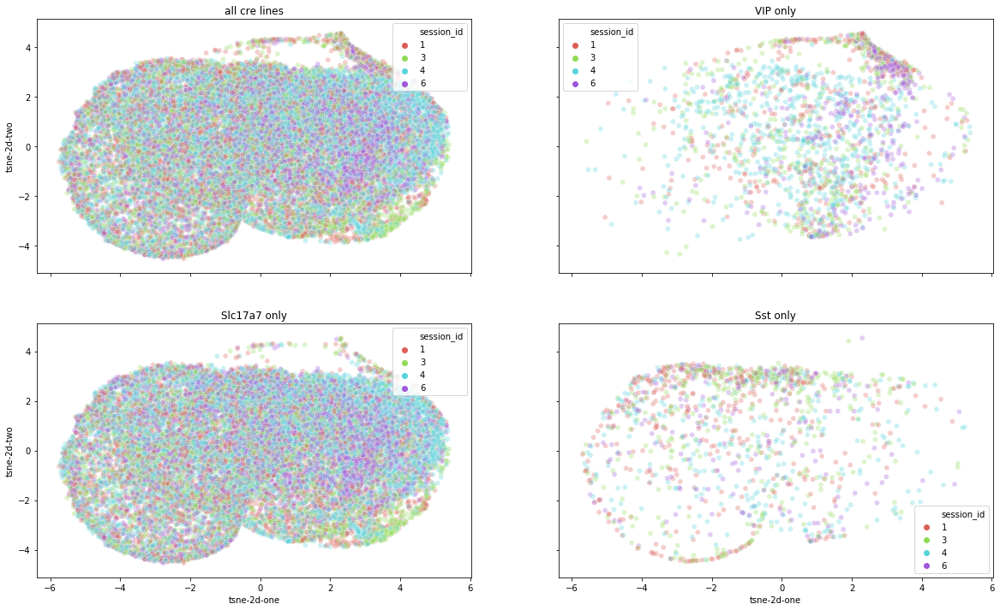

In [32]:
fig,ax=plt.subplots(2,2,figsize=(20,12),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm, #.query('cre_line=="Vip-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[0,0]
)
ax[0,0].set_title('all cre lines')

sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Vip-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[0,1]
)
ax[0,1].set_title('VIP only')

sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Slc17a7-IRES2-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[1,0]
)
ax[1,0].set_title('Slc17a7 only')

sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Sst-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[1,1]
)
ax[1,1].set_title('Sst only')

### plot tsne again, colored continuously by the omissions dropout

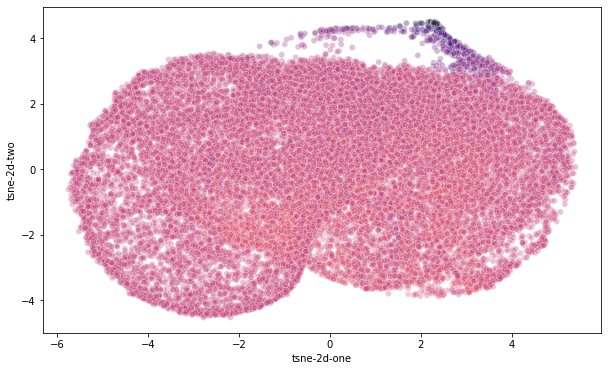

In [33]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue='omissions',
    palette='magma',
    data=rspm.query('omissions>-1 and omissions<1'),
    legend=False,
    alpha=0.3,
    ax=ax
)


### do kmeans clustring on the tsne space

In [34]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(rspm[cols_for_clustering])
tsne_cols = ['tsne-2d-one','tsne-2d-two']
rspm['k-means_on_tSNE'] = kmeans.fit_predict(rspm[tsne_cols])
rspm['k-means_on_tSNE'].value_counts()

0    14339
1    12456
Name: k-means_on_tSNE, dtype: int64

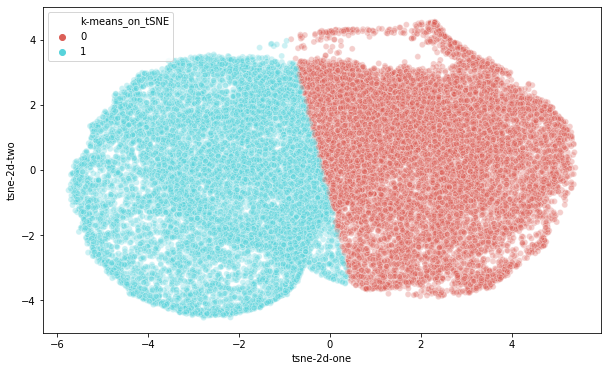

In [35]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue='k-means_on_tSNE',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend='full',
    alpha=0.3,
    ax=ax,
)

# UMAP

In [105]:
import umap

min_dist = 0
spread=5
n_neighbors = 10
metric = 'euclidean'

reducer = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, spread=spread)

mapper = reducer.fit(rspm[cols_for_clustering])

embedding = reducer.fit_transform(rspm[cols_for_clustering])
embedding.shape

C:\Users\marinag\AppData\Roaming\Python\Python37\site-packages\umap\umap_.py:1158: RuntimeWarning:

divide by zero encountered in power

C:\Users\marinag\AppData\Roaming\Python\Python37\site-packages\umap\umap_.py:1158: RuntimeWarning:

divide by zero encountered in power



(26795, 2)

In [106]:
mapper.embedding_.shape

(26795, 2)

In [107]:
# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\clustering\UMAP_output'


In [108]:
# filepath = os.path.join(save_dir, '200810_UMAP_10D_GLM_fraction_change_in_explained_variance')
# np.save(file=filepath, arr=embedding_3d)

In [109]:
# filepath = os.path.join(save_dir, '200810_UMAP_3D_GLM_fraction_change_in_explained_variance')
# np.save(file=filepath, arr=embedding_3d)

In [110]:
# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\clustering\UMAP_output'
# filepath = os.path.join(save_dir, '200810_UMAP_2D_GLM_fraction_change_in_explained_variance.npy')
# data = np.load(filepath)

### assign umap results to new columns

In [111]:
rspm['umap_embedding_0'] = embedding[:, 0]
rspm['umap_embedding_1'] = embedding[:, 1]
# rspm['umap_embedding_2'] = embedding[:, 2]


In [112]:
umap_cols = ['umap_embedding_0', 'umap_embedding_1']#, 'umap_embedding_2']

### do kmeans on the 2d embedding
only two clusters since the 2d umap gives two clear clusters
k-means seems to identify them perfectly!

In [113]:
kmeans = KMeans(n_clusters=3)
umap_cols = ['umap_embedding_0','umap_embedding_1']
rspm['k-means_on_umap'] = kmeans.fit_predict(rspm[umap_cols])
rspm['k-means_on_umap'].value_counts()

0    10141
1     8378
2     8276
Name: k-means_on_umap, dtype: int64

### plot the results in 2D
k-means clearly didn't do a good job of identifying two of the three clusters

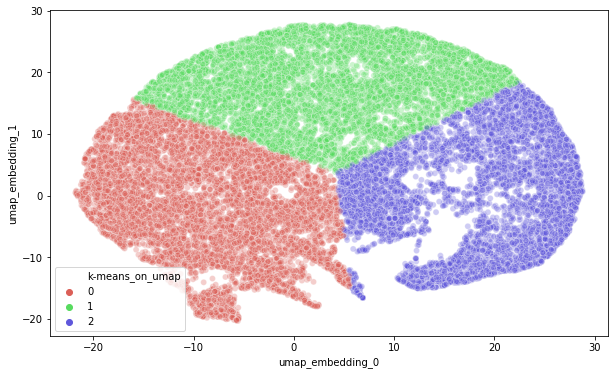

In [114]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_embedding_0', 
    y='umap_embedding_1',
    hue='k-means_on_umap',
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend='full',
    alpha=0.3,
    ax=ax,
)

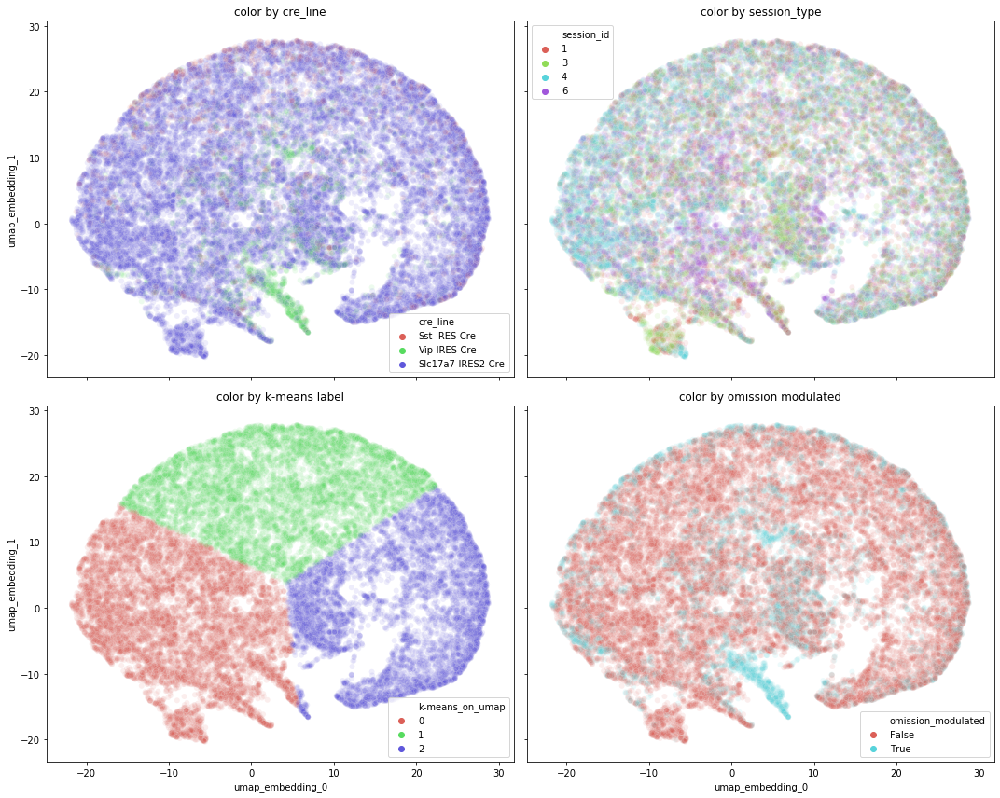

In [115]:
import seaborn as sns
fig,ax=plt.subplots(2,2,figsize=(15,12),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_embedding_0', 
    y='umap_embedding_1',
    hue="cre_line",
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[0,0]
)
sns.scatterplot(
    x='umap_embedding_0', 
    y='umap_embedding_1',
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[0,1]
)
sns.scatterplot(
    x='umap_embedding_0', 
    y='umap_embedding_1',
    hue='k-means_on_umap',
    palette=sns.color_palette("hls", len(rspm['k-means_on_umap'].unique())),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[1,0]
)
sns.scatterplot(
    x='umap_embedding_0', 
    y='umap_embedding_1',
    hue='omission_modulated',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[1,1]
)
fig.tight_layout()
for ii,hue in enumerate(['cre_line','session_type','k-means label', 'omission modulated']):
    ax.flatten()[ii].set_title('color by {}'.format(hue))
fig.tight_layout()

Text(0.5, 1.0, 'Sst only')

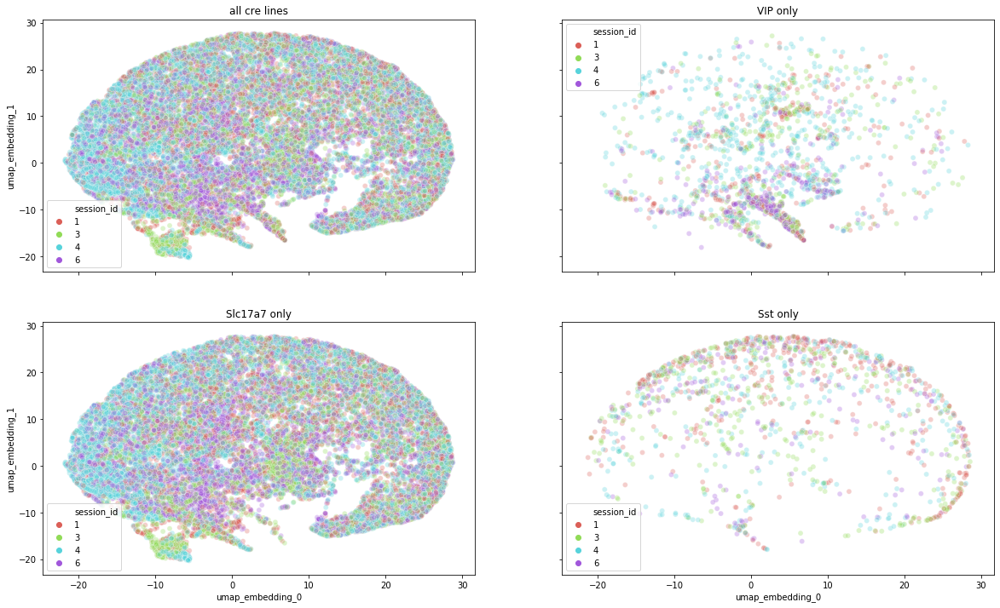

In [116]:
fig,ax=plt.subplots(2,2,figsize=(20,12),sharey=True,sharex=True)
sns.scatterplot(
    x="umap_embedding_0", 
    y="umap_embedding_1",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm, #.query('cre_line=="Vip-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[0,0]
)
ax[0,0].set_title('all cre lines')

sns.scatterplot(
    x="umap_embedding_0", 
    y="umap_embedding_1",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Vip-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[0,1]
)
ax[0,1].set_title('VIP only')

sns.scatterplot(
    x="umap_embedding_0", 
    y="umap_embedding_1",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Slc17a7-IRES2-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[1,0]
)
ax[1,0].set_title('Slc17a7 only')

sns.scatterplot(
    x="umap_embedding_0", 
    y="umap_embedding_1",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Sst-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[1,1]
)
ax[1,1].set_title('Sst only')

### now make a 3d plotly plot of the same

In [117]:
import plotly.express as px
fig = px.scatter_3d(
    rspm, 
    x='umap_embedding_0', 
    y='umap_embedding_1', 
    z='umap_embedding_2',
    color='k-means_on_umap'
)
fig.show()

### plot umap with omissions modulation as continuous color

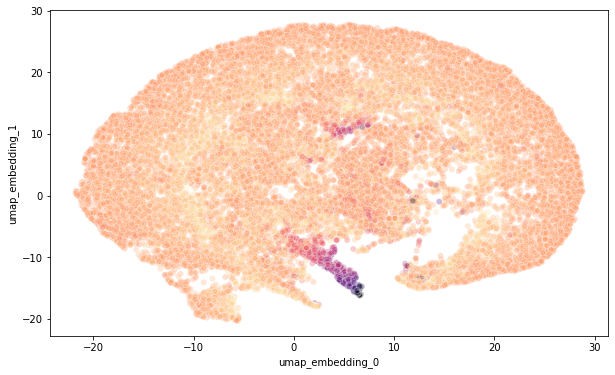

In [118]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
ax = sns.scatterplot(
    x='umap_embedding_0', 
    y='umap_embedding_1',
    hue='omissions',
    palette='magma',
    data=rspm.query('omissions>-1 and omissions<0.25'),
    legend=False,
    alpha=0.3,
    ax=ax,
)
# plt.colorbar(cax=ax, title='omission_modulation')